### Import libraries


In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy as cartopy
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score
import cftime as cftime
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import matplotlib.gridspec as gridspec
import statsmodels.api as sm
import math

import matplotlib.dates as mdates
import matplotlib.cbook as cbook
import random
from joblib import Parallel, delayed
import multiprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib
import matplotlib.patches as mpatches
from matplotlib import animation
import pandas as pd
import warnings
import pickle
from datetime import date
import seaborn as sns
warnings.filterwarnings('ignore')
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import matplotlib.ticker as mticker
import importlib


import statsmodels.api as sm

import sklearn
from sklearn import preprocessing
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn import preprocessing 

import scipy.interpolate as interp

warnings.filterwarnings('ignore')
from datetime import timedelta
from joblib import Parallel, delayed
import multiprocessing

num_cores = multiprocessing.cpu_count()

import logging
logging.getLogger().setLevel(logging.CRITICAL)
import matplotlib.ticker as ticker
from format import *

### Constant

In [2]:
# number of clusters
num_clusters = 4

# number of ensemble members from dataset
num_ensembles = 10

# minimum wind speed threshold for all model ensemble storms 
min_wind = 17

# minimum wind speed threshold for historical dataset storms 
min_wind_hist = 17

# peak wind speed threshold for storms used to define clusters
min_wind2=17

# After clusters are defined, analyze only hurricanes (Peak wind speed > 33)
peak_wind=33

year_start= 1970
year_end = 2021



### Open observed and modeled track datasets, cluster tracks using k-means clustering

In [3]:
import restructure_cluster_datasets2
import analyze_clusters
importlib.reload(restructure_cluster_datasets2)
importlib.reload(analyze_clusters)


#Read model ensemble tracks
dsModelTracks=xr.open_dataset('/tigress/gvecchi/ANALYSIS/AM2.5_C360/TRAJ_amiplong_chancorr/NETCDF_TRACKS/tracks_NA.nc')
dsModelTracks = dsModelTracks.sel(YRT=slice(year_start,year_end,1))

# read historical dataset from IBTrACS, convert to XARRAY dataset 
observedTracks = xr.open_dataset('data/inputs/IBTrACS.NA.v04r00.nc')
dsObservedTracks = restructure_cluster_datasets2.constructXR(observedTracks, num_ensembles,year_start,year_end)

#merge model and historical data; prepare the data to be clustered
modelAndObservedTracks = restructure_cluster_datasets2.Restructure_Data(dsModelTracks,dsObservedTracks, num_ensembles+1, num_clusters, min_wind, min_wind_hist, min_wind2)

# construct k-means clusters
clusterObject= restructure_cluster_datasets2.defCluster(modelAndObservedTracks)

#dataframe with each row being one storm, showing 10 latitude and longitude points, the cluster assignment, ensemble member, year, and max wind speed
full = clusterObject.cluster()
full_storms = full.copy()
full = full[full['maxwind']>=peak_wind].reset_index().drop('index',axis = 1)

# define lists (each element corresponding to one ensemble member) of dataframes of the latitude and longitude points of each storm (each row is one storm)
theClusters, dfLats, dfLons= analyze_clusters.clusters_list(num_ensembles, clusterObject, num_clusters, peak_wind)

#define dataframe where each row is a point in a storm with latitude, longitude, year, cluster, ensemble member, and maximum wind speed
dfAllPoints = analyze_clusters.dfAll(num_ensembles, dfLats,dfLons,full, peak_wind)

#define dataframe of the genesis points of each storm
dfGenesis = analyze_clusters.get_df_GENS(dfLons,dfLats)




# Visualize distribution of model and observed hurricane tracks

#### Distribution of model ensemble and observed genesis points and tracks

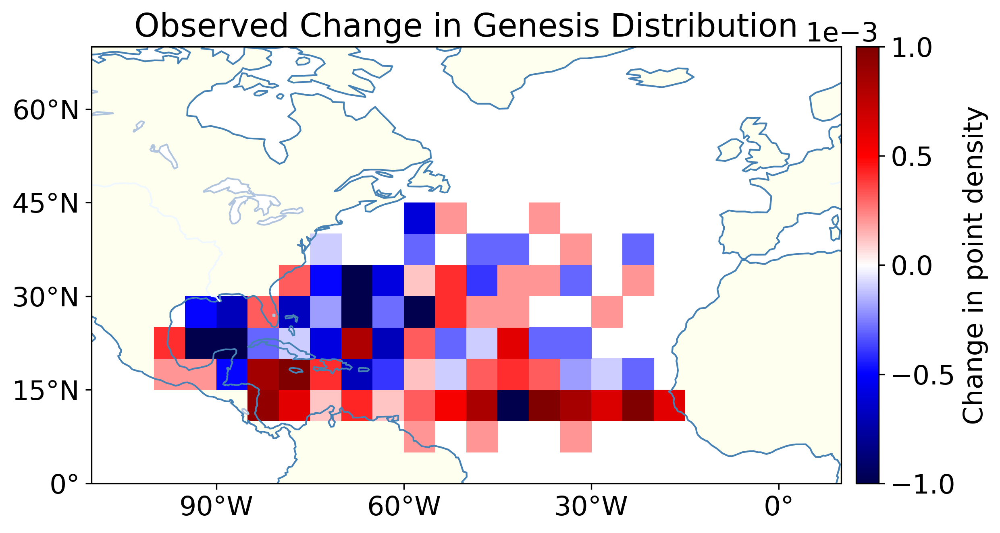

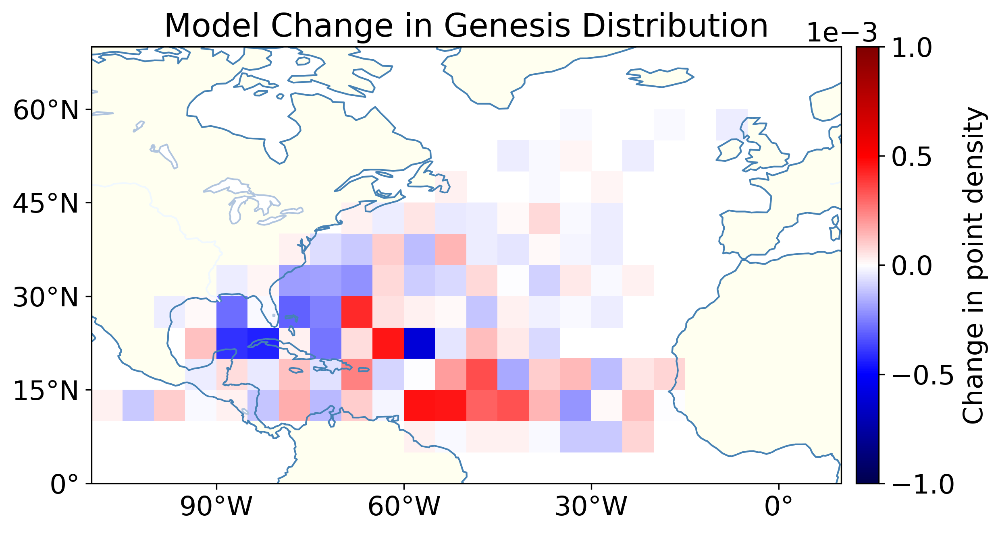

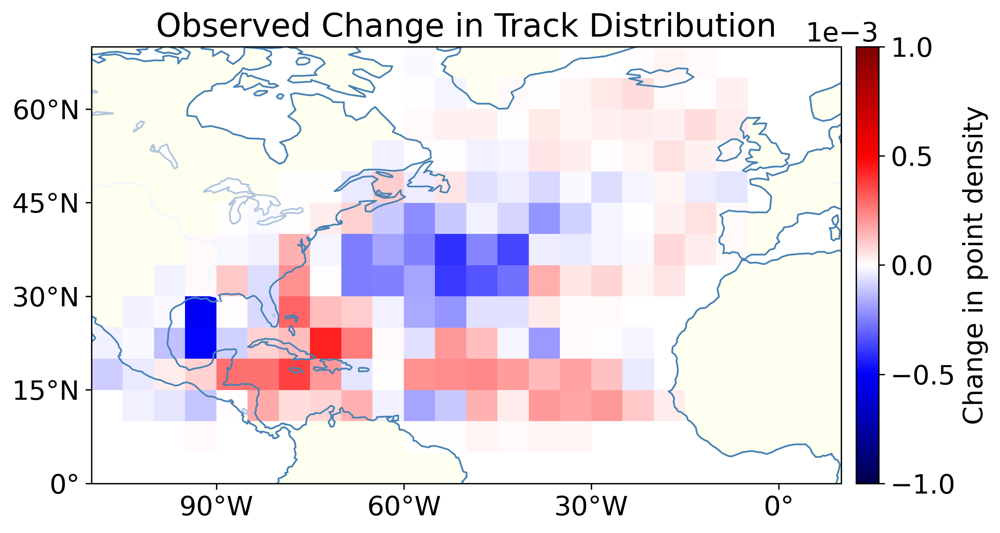

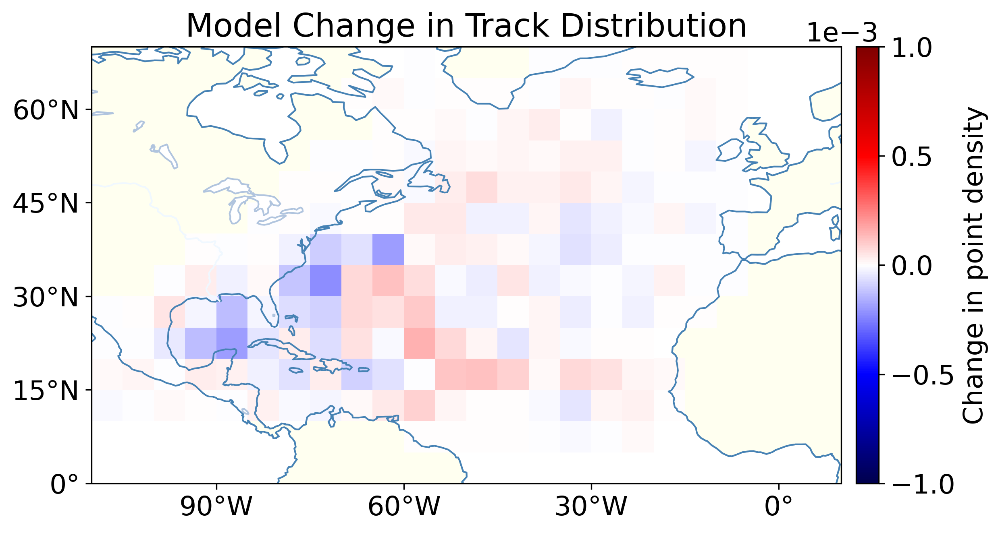

In [6]:
importlib.reload(visualize_historical)
visualize_historical.gen_plot_historical(num_ensembles,dfGenesis, full,peak_thresh=peak_wind, square=False, normed=True, thefilter=1, one = True, title= "Observed Change in Genesis Distribution")
visualize_historical.gen_plot_model(num_ensembles,dfGenesis, full,peak_thresh=peak_wind, square=False, normed=True, thefilter=1, one = True, title= "Model Change in Genesis Distribution")

visualize_historical.all_plot_historical(num_ensembles, dfAllPoints, peak_thresh=peak_wind, square=False, normed=True, thefilter=1, year_div = 1996, one = True, title= "Observed Change in Track Distribution")
visualize_historical.all_plot_model(num_ensembles, dfAllPoints, peak_thresh=peak_wind, square=False, normed=True, thefilter=1, year_div = 1996, one = True, title= "Model Change in Track Distribution")






#### Time series of hurricane frequency and average latitude and longitude, with 5 year rolling average 

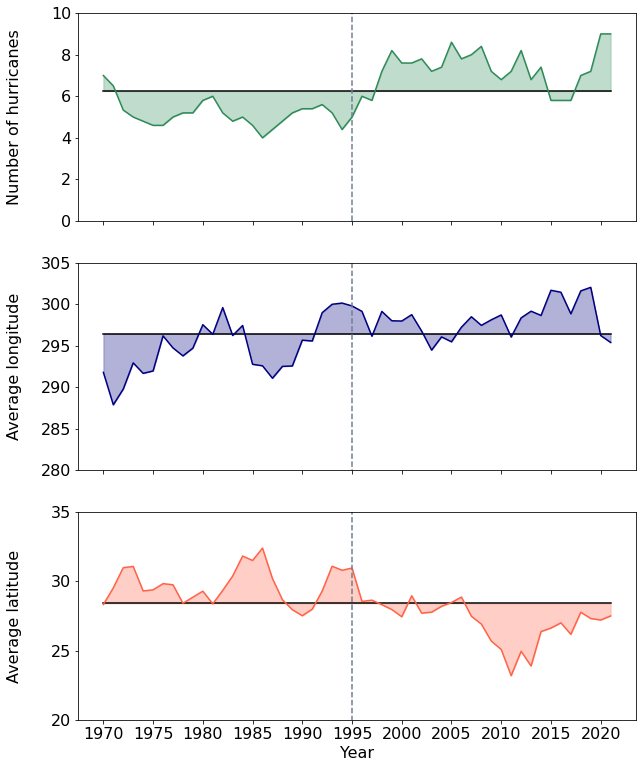

In [5]:
importlib.reload(visualize_historical)
visualize_historical.timeseries(num_ensembles, theClusters,full, num_ensembles,wind_thresh=peak_wind)



# Visualize cluster results

#### Plot silhouette scores

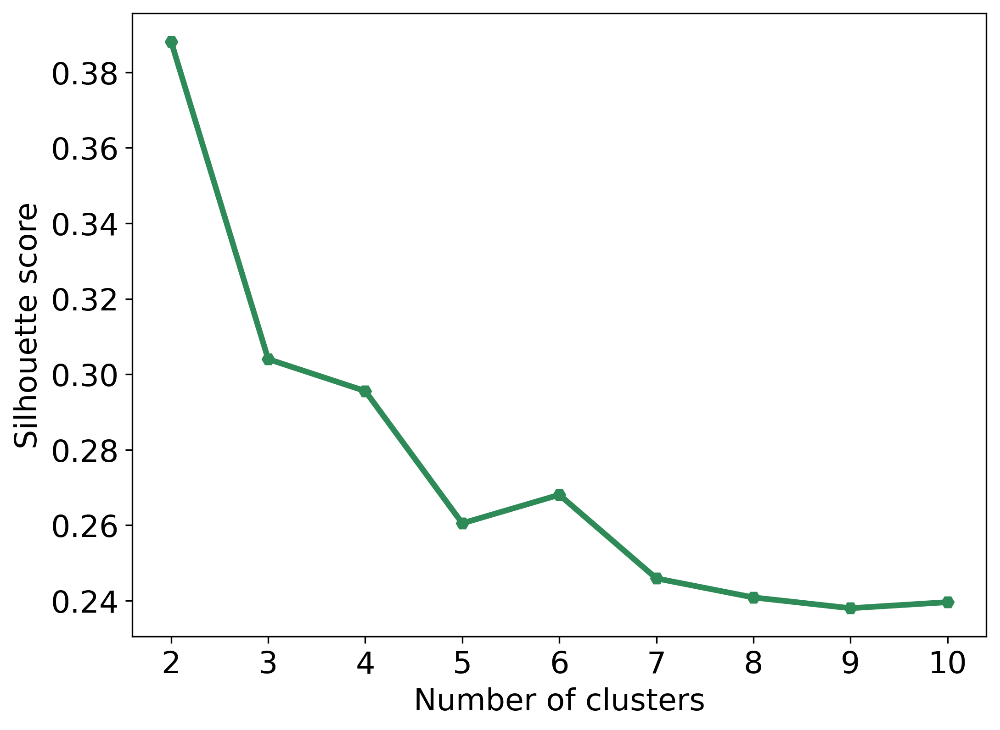

In [7]:
restructure_cluster_datasets2.plot_silhouette_scores(clusterObject.silhouette_score())


#### Plot cluster locations

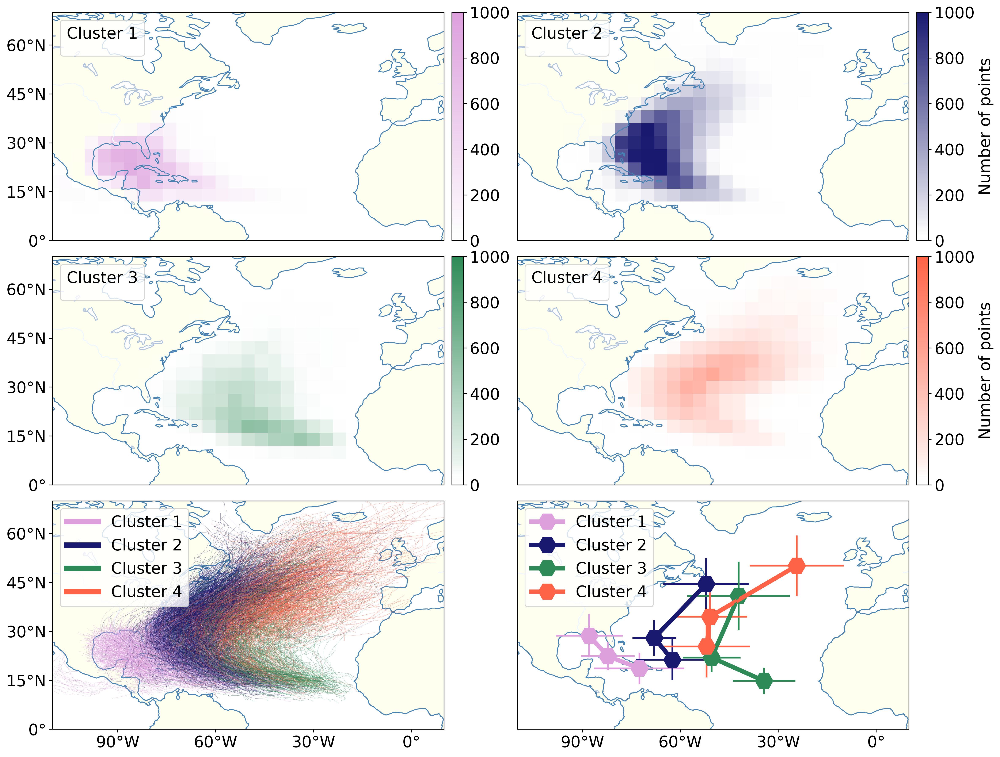

In [8]:
importlib.reload(analyze_clusters)
analyze_clusters.visualize_clusters(full,dfAllPoints,dfLats, dfLons, num_ensembles, num_clusters)




#### Print cluster statistics 

In [16]:

full_storms[['cluster','Zstorm','dataset','Year','maxwind']].groupby([full_storms['dataset']>9,full_storms['maxwind']>33,'cluster']).count()




Zstorm  dataset  Year  maxwind
dataset maxwind cluster                                
False   False   0           392      392   392      392
                1           354      354   354      354
                2           231      231   231      231
                3           197      197   197      197
        True    0           626      626   626      626
                1          1012     1012  1012     1012
                2           356      356   356      356
                3           596      596   596      596
True    False   0            50       50    50       50
                1            64       64    64       64
                2            54       54    54       54
                3            41       41    41       41
        True    0           104      104   104      104
                1           102      102   102      102
                2            59       59    59       59
                3            65       65    65       65

In [17]:
full[['cluster','Zstorm','dataset','Year','maxwind']].groupby([full['dataset']>9,full['Year']>1995,'cluster']).count()


Zstorm  dataset  Year  maxwind
dataset Year  cluster                                
False   False 0           279      279   279      279
              1           451      451   451      451
              2           135      135   135      135
              3           258      258   258      258
        True  0           347      347   347      347
              1           561      561   561      561
              2           221      221   221      221
              3           339      339   339      339
True    False 0            41       41    41       41
              1            45       45    45       45
              2            21       21    21       21
              3            27       27    27       27
        True  0            63       63    63       63
              1            57       57    57       57
              2            38       38    38       38
              3            38       38    38       38

In [18]:
full[['cluster','Zstorm','dataset','Year','maxwind']].groupby([full['Year']>1995,'cluster',full['dataset']==10]).count()




Zstorm  dataset  Year  maxwind
Year  cluster dataset                                
False 0       False       279      279   279      279
              True         41       41    41       41
      1       False       451      451   451      451
              True         45       45    45       45
      2       False       135      135   135      135
              True         21       21    21       21
      3       False       258      258   258      258
              True         27       27    27       27
True  0       False       347      347   347      347
              True         63       63    63       63
      1       False       561      561   561      561
              True         57       57    57       57
      2       False       221      221   221      221
              True         38       38    38       38
      3       False       339      339   339      339
              True         38       38    38       38

#### Plot cluster genesis locations

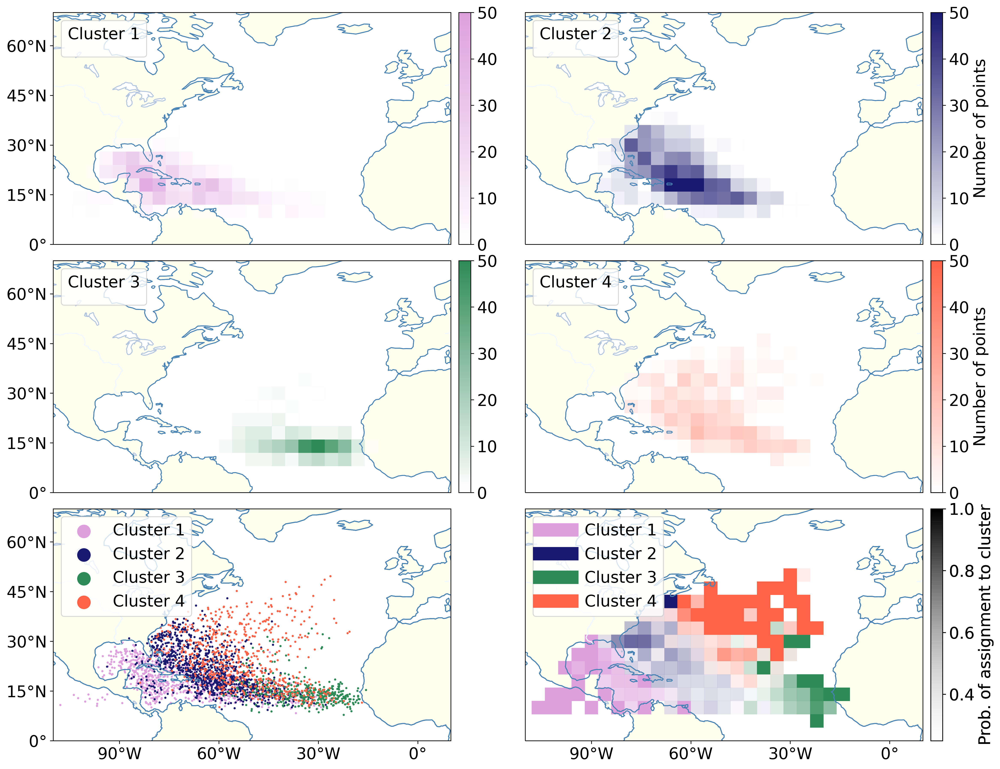

In [19]:
import visualize_genesis_location
importlib.reload(visualize_genesis_location)

visualize_genesis_location.gen_plot(dfGenesis,num_ensembles, num_clusters)



# Visualize changes in cluster assingments over time

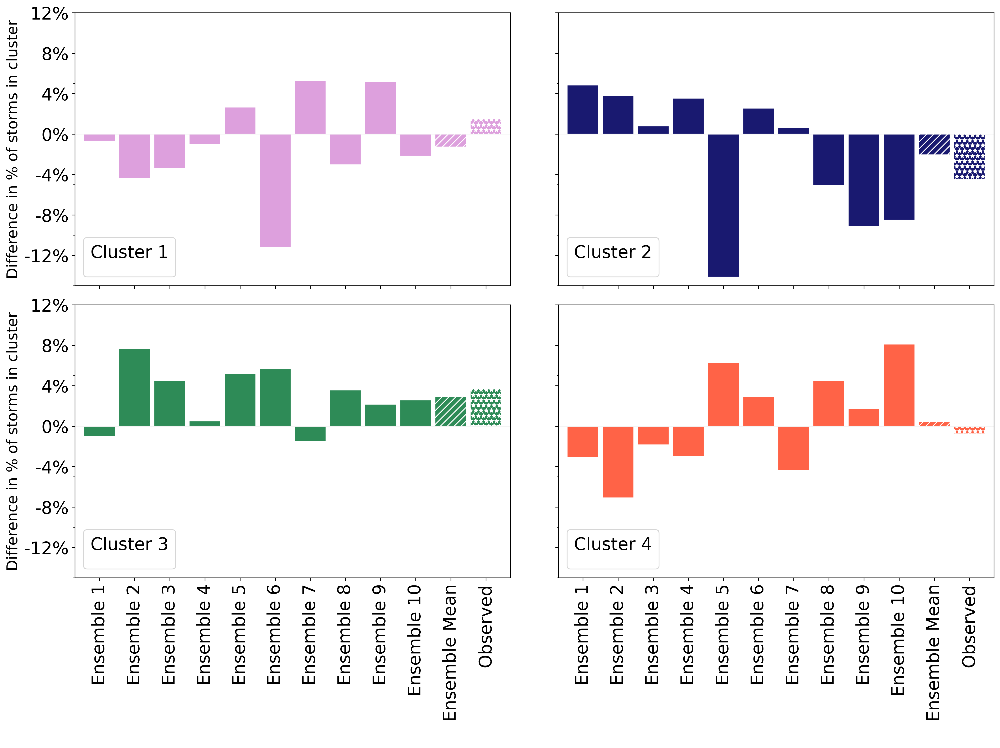

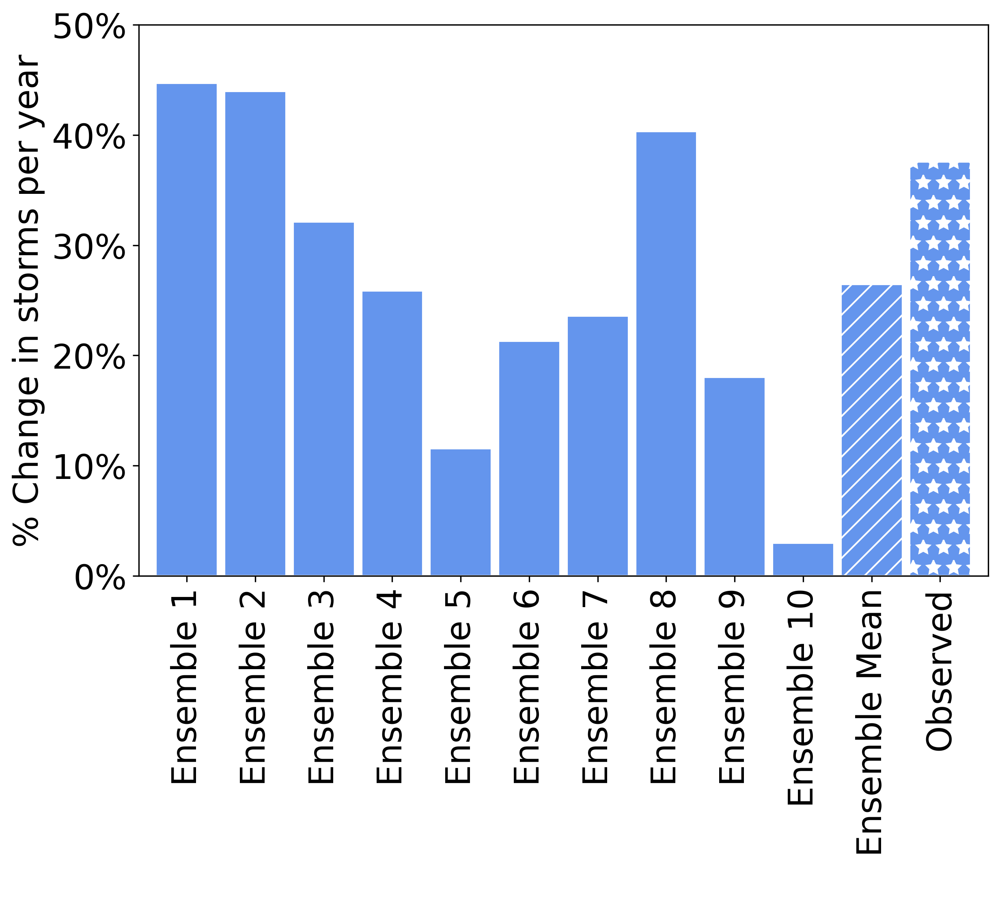

In [9]:
import cluster_time_change
importlib.reload(cluster_time_change)

dfClusteredBar=cluster_time_change.get_df_for_clusteredBar(theClusters, full, num_ensembles)

cluster_time_change.plot_ClusteredBar(dfClusteredBar, num_ensembles, num_clusters)

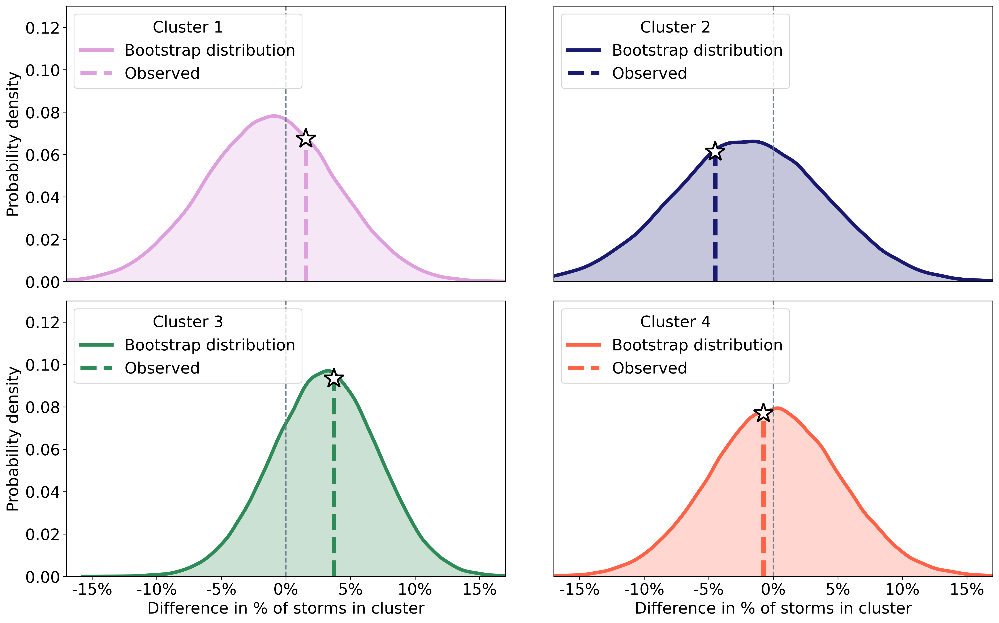

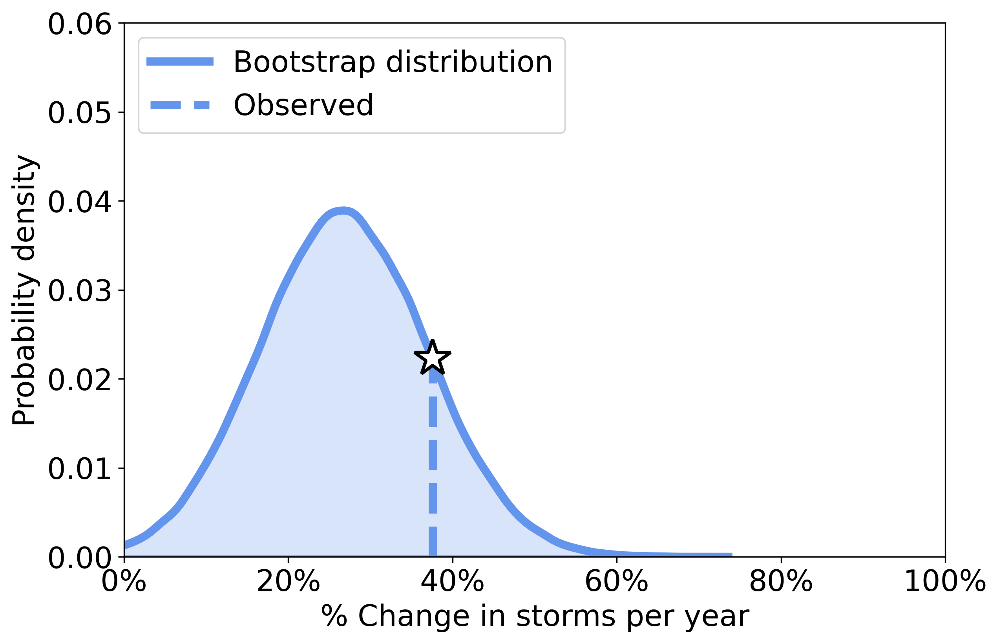

In [6]:
import bootstrap
importlib.reload(bootstrap)
thedf = bootstrap.get_the_df(num_ensembles, theClusters,full,hurricane_only = True)
thedfs = bootstrap.get_the_dfs(num_ensembles, full, num_clusters,  hurricane_only = True)
# columnsFull = bootstrap.get_columns_Full(1000, num_ensembles, thedf, num_clusters)
# dfHist  = bootstrap.make_df(columnsFull, num_clusters)
# with open('data/dfHist2', 'wb') as f:
#     pickle.dump(dfHist,f)

with open('data/dfHist', 'rb') as f:
        dfHist = pickle.load(f)
bootstrap.plot_cluster_hists(dfHist, thedfs, num_ensembles, num_clusters, smooth_param = 1)

bootstrap.plot_freq_hist(dfHist, thedfs, num_ensembles, num_clusters)




In [22]:
dfHist.mean()

Proportion cluster 0    -1.209971
Proportion cluster 1    -1.920136
Proportion cluster 2     3.015498
Proportion cluster 3     0.114609
total number storms     26.737187
dtype: float64

In [23]:
dfHist.std()

Proportion cluster 0     5.079651
Proportion cluster 1     5.912666
Proportion cluster 2     4.120946
Proportion cluster 3     5.021446
total number storms     10.275797
dtype: float64

### Visualize changes in model SLP and genesis locations over time associated with changes in clusters



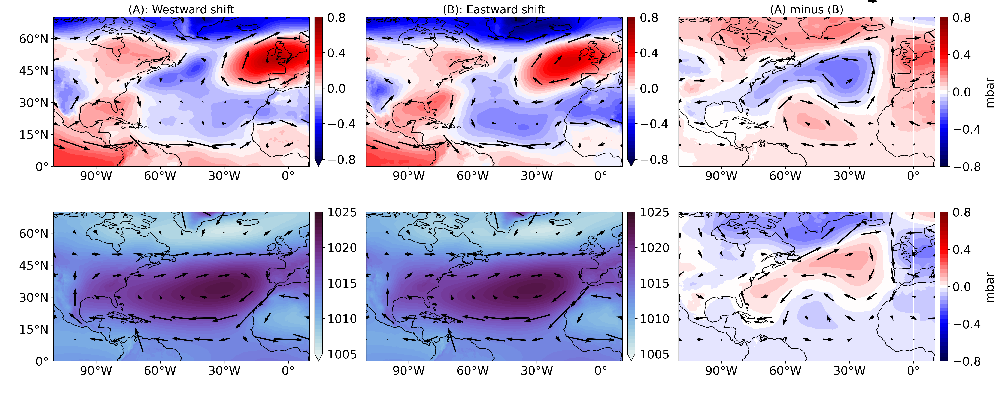

In [17]:
import SLP_boots2
import SLP_data
import gen_boots
import bootstrap2
importlib.reload(SLP_data)
importlib.reload(bootstrap2)
importlib.reload(SLP_boots2)
importlib.reload(gen_boots)

#run once to save intermediate data
# bootstrap2.dumpBoots(thedf, num_ensembles, num_samples = 1000000)
# SLP_data.save_SLP_data()

importlib.reload(SLP_boots2)
hibestenses,lowbestenses,ensemblesSLP = SLP_boots2.load_data()
SLP_boots2.plot_SLP(hibestenses,lowbestenses, ensemblesSLP)






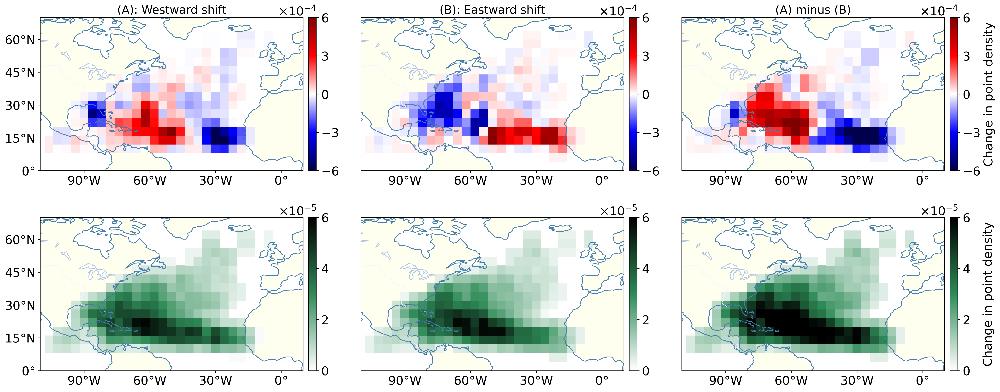

In [16]:
importlib.reload(gen_boots)
hibestdfsGEN, lowbestdfsGEN = gen_boots.get_hilow_bestdfsGEN(full, hibestenses,lowbestenses)   
gen_boots.densityAll4(hibestdfsGEN, lowbestdfsGEN)

